<a href="https://colab.research.google.com/github/Champjiwrd/CE63-21-ObjectDetection/blob/master/Copy_of_Copy_of_Color_distinguish.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
!wget https://4.bp.blogspot.com/-ukjUU_JJ6y0/WxVha1617oI/AAAAAAAAXr8/xrXPfl2DWyE-WdxvBct-HCLYt_cwbO5owCLcBGAs/s400/yourname-02m22s.png

--2020-11-01 16:36:23--  https://4.bp.blogspot.com/-ukjUU_JJ6y0/WxVha1617oI/AAAAAAAAXr8/xrXPfl2DWyE-WdxvBct-HCLYt_cwbO5owCLcBGAs/s400/yourname-02m22s.png
Resolving 4.bp.blogspot.com (4.bp.blogspot.com)... 172.217.214.132, 2607:f8b0:4001:c05::84
Connecting to 4.bp.blogspot.com (4.bp.blogspot.com)|172.217.214.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 161458 (158K) [image/png]
Saving to: ‘yourname-02m22s.png’

yourname-02m22s.png 100%[===================>] 157.67K  --.-KB/s    in 0.01s   

2020-11-01 16:36:23 (13.4 MB/s) - ‘yourname-02m22s.png’ saved [161458/161458]



In [19]:
import matplotlib.pyplot as plt
import cv2

originalImage = cv2.imread('/content/yourname-02m22s.png')
plt.imshow(cv2.cvtColor(originalImage, cv2.COLOR_BGR2RGB))
plt.ylabel('original')
plt.show()

error: ignored

In [ ]:
print(originalImage.shape)
x,y,dim = originalImage.shape
#get what x,y,color?
print(originalImage[0][0][2])

(225, 400, 3)
113


In [16]:
 import colorsys
 print(colorsys.rgb_to_hls(191, 191, 191)[2])

0.0


In [ ]:
for i in range(x):
  for j in range(y):
    r = originalImage[i][j][0]

In [15]:
def checkcolor(hue,sat,lgt,listcolor):
  if (lgt < 0.1):
    listcolor[0]+=1
    return listcolor
  if (lgt > 0.8):
    listcolor[1]+=1
    return listcolor
  if (sat < 0.1):
    listcolor[2]+=1
    return listcolor
  if (hue < 30):
    listcolor[3]+=1
    return listcolor
  if (hue < 90):
    listcolor[4]+=1
    return listcolor
  if (hue < 150):
    listcolor[5]+=1
    return listcolor
  if (hue < 210):
    listcolor[6]+=1
    return listcolor
  if (hue < 270):
    listcolor[7]+=1
    return listcolor
  if (hue < 330):
    listcolor[8]+=1
    return listcolor
  listcolor[9]+=1
  return listcolor

###Crop Image###
return รูป ใช้ pillow

crop_img(path,aw,bh,dw,ch)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ln -s /content/gdrive/My\ Drive/CEProject63-21ObjectDetection/dataset/ourdataset/ /dataset
# /mydrive/CEProject63-21ObjectDetection/dataset/ourdataset/cp_annotation/0024b8088a11fdbf19edce3e113aac72.txt

In [21]:
from PIL import Image
def cropimg(path,aw,bh,dw,ch):
  image = Image.open(path)
  width, height = image.size
  a,b,c,d = getObjPosition(width,height,aw,bh,dw,ch)
  x,y = getStartPosition(a,b,c,d)
  box = (x, y, x+d, y+c)
  cropped_image = image.crop(box)
  return cropped_image
def getObjPosition(width,height,aw,bh,dw,ch):
  a = aw*width
  b = bh*height
  c = ch*height
  d = dw*width
  return a,b,c,d
def getStartPosition(a,b,c,d):
  x = a-d/2
  y = b-c/2
  return(x,y)

In [13]:
def rgb_to_hls(r, g, b):
    #r, g, b = [x/255.0 for x in [r, g, b]]
    r = float(r)
    g = float(g)
    b = float(b)
    high = max(r, g, b)
    low = min(r, g, b)
    l = (high + low)/2

    if high == low:
        h = 0.0
        s = 0.0
    else:
        d = high - low
        s = d / (2 - high - low) if l > 0.5 else d / (high + low)
        if high == r:
          h = (g - b) / d + (6 if g < b else 0)
        elif high == g:
          h = (b - r) / d + 2
        else:
          h = ((r - g) / d) + 4
        
        h *= 60

    return h, l, s

In [40]:
import colorsys
def findColorImg(pathimg,pathtxt):
  f = open(pathtxt, "r")
  c = f.read()
  f.close()
  c = c.split('\n')
  print(c)
  img = Image.open(pathimg)
  display(img)
  llllll = ''
  for f1 in c[:-1]:
    f1 = f1.split(' ')
    print(f1)
    img = cropimg(pathimg,float(f1[1]), float(f1[2]), float(f1[3]), float(f1[4]))
    rgb_img = img.convert('RGB')
    listcolor = [0,0,0,0,0,0,0,0,0,0] # 0blacks, 1whites, 2gray, 3red, 4yellow, 5green, 6cyan, 7blue, 8magenta, 9reds
    width, height = img.size
    for i in range(width):
      for j in range(height):
        r, g, b = rgb_img.getpixel((i,j)) #h, l, s = rgb_to_hsl(r, g, b)
        r, g, b = [x/255.0 for x in [r, g, b]]
        h, l, s = rgb_to_hls(r, g, b)
        checkcolor(h,s,l,listcolor)
    print(listcolor)
    color = int(listcolor.index(max(listcolor)))
    f1[0] = color
    print(f1)
    display(rgb_img)
    llllll += str(color)+' '+str(f1[1])+' '+str(f1[2])+' '+str(f1[3])+'\n'
  return llllll

00a290dc3ec3a138dd628a07a1ada8d6.jpg 00a290dc3ec3a138dd628a07a1ada8d6.txt
['0 0.466667 0.455556 0.060417 0.124074', '0 0.405208 0.453241 0.061458 0.119444', '0 0.671615 0.927778 0.069271 0.144444', '0 0.664844 0.877315 0.096354 0.219444', '0 0.656510 0.699074 0.059896 0.131481', '0 0.027083 0.645833 0.053125 0.121296', '0 0.526042 0.377778 0.037500 0.140741', '0 0.381771 0.282870 0.047917 0.099074', '0 0.325260 0.275926 0.048438 0.085185', '0 0.261719 0.226852 0.042188 0.048148', '0 0.159896 0.236111 0.036458 0.083333', '0 0.062500 0.390278 0.050000 0.063889', '0 0.099219 0.546296 0.066146 0.137037', '0 0.033594 0.530556 0.060937 0.118519', '0 0.281771 0.468519 0.070833 0.075926', '0 0.303646 0.423611 0.061458 0.108333', '0 0.519010 0.198148 0.031771 0.083333', '0 0.446354 0.264352 0.041667 0.089815', '0 0.570312 0.326389 0.030208 0.136111', '0 0.606771 0.262963 0.027083 0.087037', '0 0.614583 0.346296 0.028125 0.101852', '0 0.571875 0.176852 0.020833 0.062963', '0 0.224740 0.150000 0.

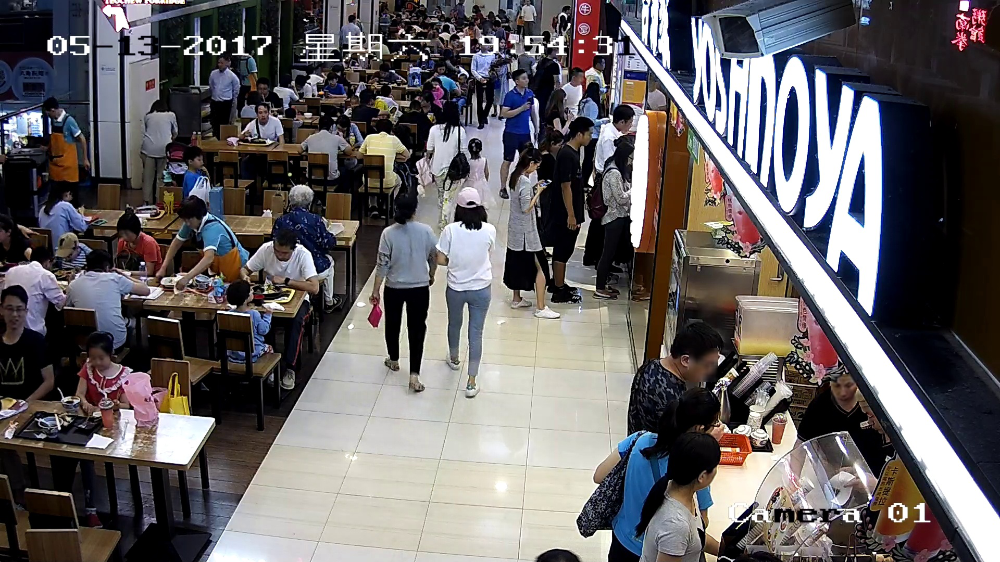

['0', '0.466667', '0.455556', '0.060417', '0.124074']
[433, 8891, 2875, 196, 1077, 0, 48, 2024, 0, 0]
[1, '0.466667', '0.455556', '0.060417', '0.124074']


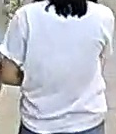

['0', '0.405208', '0.453241', '0.061458', '0.119444']
[728, 312, 5256, 402, 558, 0, 449, 7394, 44, 79]
[7, '0.405208', '0.453241', '0.061458', '0.119444']


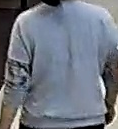

['0', '0.671615', '0.927778', '0.069271', '0.144444']
[3573, 451, 9956, 2198, 1543, 0, 815, 2137, 35, 40]
[2, '0.671615', '0.927778', '0.069271', '0.144444']


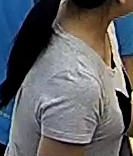

['0', '0.664844', '0.877315', '0.096354', '0.219444']
[14240, 1353, 9544, 2521, 2277, 12, 5686, 8159, 25, 28]
[0, '0.664844', '0.877315', '0.096354', '0.219444']


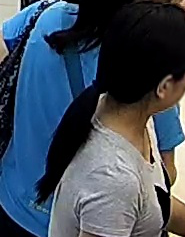

['0', '0.656510', '0.699074', '0.059896', '0.131481']
[8758, 248, 2931, 1734, 688, 0, 6, 1944, 6, 15]
[0, '0.656510', '0.699074', '0.059896', '0.131481']


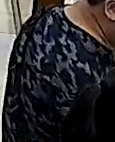

['0', '0.027083', '0.645833', '0.053125', '0.121296']
[10091, 4, 1098, 1604, 167, 0, 0, 217, 24, 157]
[0, '0.027083', '0.645833', '0.053125', '0.121296']


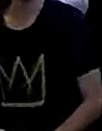

['0', '0.526042', '0.377778', '0.037500', '0.140741']
[2049, 368, 7291, 367, 362, 0, 6, 440, 27, 34]
[2, '0.526042', '0.377778', '0.037500', '0.140741']


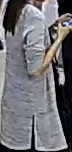

['0', '0.381771', '0.282870', '0.047917', '0.099074']
[2944, 483, 654, 487, 4967, 0, 5, 299, 4, 1]
[4, '0.381771', '0.282870', '0.047917', '0.099074']


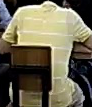

['0', '0.325260', '0.275926', '0.048438', '0.085185']
[2426, 15, 3992, 721, 1133, 0, 11, 185, 41, 32]
[2, '0.325260', '0.275926', '0.048438', '0.085185']


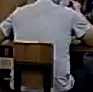

['0', '0.261719', '0.226852', '0.042188', '0.048148']
[607, 309, 850, 400, 127, 0, 33, 1575, 156, 155]
[7, '0.261719', '0.226852', '0.042188', '0.048148']


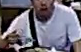

['0', '0.159896', '0.236111', '0.036458', '0.083333']
[881, 6, 4754, 4, 12, 0, 0, 493, 19, 131]
[2, '0.159896', '0.236111', '0.036458', '0.083333']


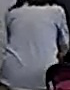

['0', '0.062500', '0.390278', '0.050000', '0.063889']
[1288, 129, 463, 103, 314, 0, 0, 4298, 19, 10]
[7, '0.062500', '0.390278', '0.050000', '0.063889']


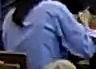

['0', '0.099219', '0.546296', '0.066146', '0.137037']
[6085, 370, 2919, 375, 74, 0, 10, 8619, 219, 125]
[7, '0.099219', '0.546296', '0.066146', '0.137037']


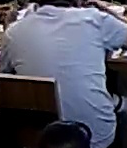

['0', '0.033594', '0.530556', '0.060937', '0.118519']
[3447, 872, 2320, 1225, 211, 0, 0, 5172, 1022, 707]
[7, '0.033594', '0.530556', '0.060937', '0.118519']


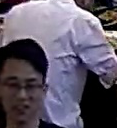

['0', '0.281771', '0.468519', '0.070833', '0.075926']
[1847, 1389, 3903, 1828, 379, 0, 69, 1613, 72, 52]
[2, '0.281771', '0.468519', '0.070833', '0.075926']


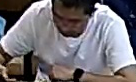

['0', '0.303646', '0.423611', '0.061458', '0.108333']
[4219, 900, 1495, 908, 876, 4, 19, 5300, 44, 41]
[7, '0.303646', '0.423611', '0.061458', '0.108333']


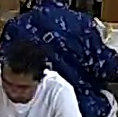

['0', '0.519010', '0.198148', '0.031771', '0.083333']
[302, 251, 428, 108, 23, 0, 2, 4334, 22, 20]
[7, '0.519010', '0.198148', '0.031771', '0.083333']


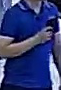

['0', '0.446354', '0.264352', '0.041667', '0.089815']
[1787, 2148, 1874, 5, 0, 1, 37, 1853, 31, 24]
[1, '0.446354', '0.264352', '0.041667', '0.089815']


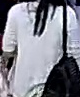

['0', '0.570312', '0.326389', '0.030208', '0.136111']
[6238, 9, 672, 1080, 325, 0, 0, 189, 5, 8]
[0, '0.570312', '0.326389', '0.030208', '0.136111']


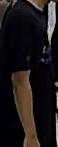

['0', '0.606771', '0.262963', '0.027083', '0.087037']
[969, 1602, 562, 60, 1, 0, 17, 1620, 19, 38]
[7, '0.606771', '0.262963', '0.027083', '0.087037']


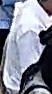

['0', '0.614583', '0.346296', '0.028125', '0.101852']
[1285, 163, 4206, 0, 0, 0, 7, 261, 15, 3]
[2, '0.614583', '0.346296', '0.028125', '0.101852']


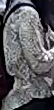

['0', '0.571875', '0.176852', '0.020833', '0.062963']
[178, 517, 953, 38, 0, 0, 2, 798, 140, 94]
[2, '0.571875', '0.176852', '0.020833', '0.062963']


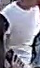

['0', '0.224740', '0.150000', '0.030729', '0.055556']
[363, 60, 109, 0, 0, 0, 0, 3007, 1, 0]
[7, '0.224740', '0.150000', '0.030729', '0.055556']


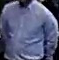

00ddf3f92ee0d7e5c4c80004b8f5d8f5.jpg 00ddf3f92ee0d7e5c4c80004b8f5d8f5.txt
['0 0.274219 0.402778 0.130729 0.325926', '0 0.372917 0.427778 0.096875 0.264815', '0 0.651563 0.370833 0.133333 0.191667', '0 0.775260 0.434259 0.111979 0.292593', '0 0.438542 0.212037 0.113542 0.240741', '0 0.285156 0.181019 0.116146 0.158333', '0 0.163802 0.124074 0.096354 0.246296', '0 0.727083 0.102315 0.104167 0.202778', '0 0.625521 0.072222 0.096875 0.142593', '0 0.908333 0.840741 0.147917 0.318519', '']


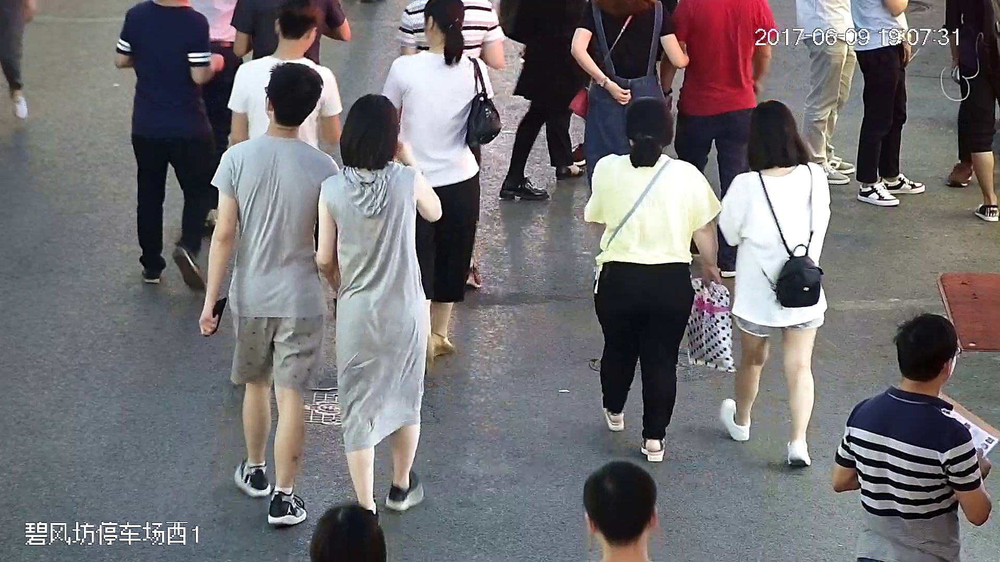

['0', '0.274219', '0.402778', '0.130729', '0.325926']
[2253, 7401, 47325, 10272, 2816, 3, 11332, 6869, 0, 81]
[2, '0.274219', '0.402778', '0.130729', '0.325926']


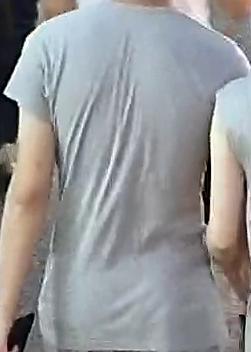

['0', '0.372917', '0.427778', '0.096875', '0.264815']
[567, 10201, 29015, 3496, 113, 60, 5062, 4608, 55, 19]
[2, '0.372917', '0.427778', '0.096875', '0.264815']


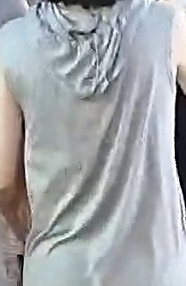

['0', '0.651563', '0.370833', '0.133333', '0.191667']
[961, 38200, 7067, 2148, 2514, 229, 258, 1590, 11, 14]
[1, '0.651563', '0.370833', '0.133333', '0.191667']


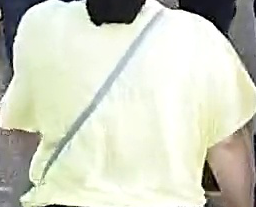

['0', '0.775260', '0.434259', '0.111979', '0.292593']
[1558, 43679, 10864, 636, 492, 10, 2176, 7872, 607, 46]
[1, '0.775260', '0.434259', '0.111979', '0.292593']


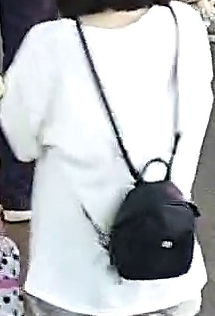

['0', '0.438542', '0.212037', '0.113542', '0.240741']
[1370, 31740, 10819, 2055, 97, 0, 722, 6503, 1713, 1661]
[1, '0.438542', '0.212037', '0.113542', '0.240741']


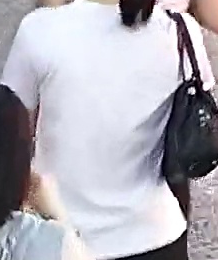

['0', '0.285156', '0.181019', '0.116146', '0.158333']
[5761, 13177, 7755, 6089, 728, 12, 907, 2703, 629, 372]
[1, '0.285156', '0.181019', '0.116146', '0.158333']


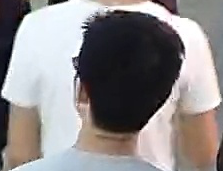

['0', '0.163802', '0.124074', '0.096354', '0.246296']
[1778, 578, 8360, 1898, 251, 0, 111, 34686, 1150, 398]
[7, '0.163802', '0.124074', '0.096354', '0.246296']


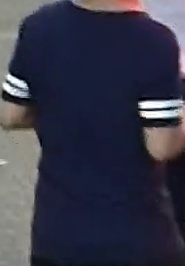

['0', '0.727083', '0.102315', '0.104167', '0.202778']
[446, 772, 4384, 4174, 140, 2, 2, 366, 188, 33326]
[9, '0.727083', '0.102315', '0.104167', '0.202778']


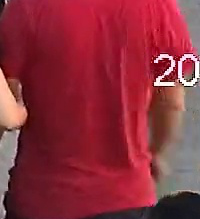

['0', '0.625521', '0.072222', '0.096875', '0.142593']
[9199, 1802, 4066, 6496, 59, 0, 3, 3249, 1990, 1780]
[0, '0.625521', '0.072222', '0.096875', '0.142593']


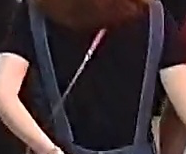

['0', '0.908333', '0.840741', '0.147917', '0.318519']
[14535, 3303, 51747, 7541, 385, 0, 710, 18984, 291, 200]
[2, '0.908333', '0.840741', '0.147917', '0.318519']


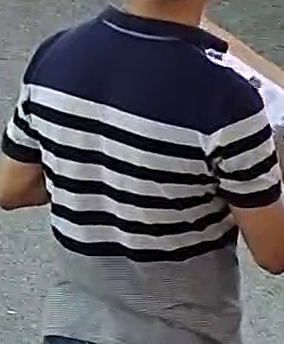

0a0eb71384f56d77ced5f6dbcfdfac1e.jpg 0a0eb71384f56d77ced5f6dbcfdfac1e.txt
['0 0.341667 0.668519 0.117708 0.281481', '0 0.421354 0.444444 0.086458 0.155556', '0 0.541667 0.450926 0.077083 0.175926', '0 0.619792 0.715278 0.061458 0.215741', '0 0.670312 0.930093 0.097917 0.139815', '0 0.066927 0.944444 0.088021 0.109259', '0 0.410156 0.257870 0.041146 0.086111', '0 0.244271 0.528241 0.054167 0.123148', '0 0.378125 0.143519 0.015625 0.048148', '']


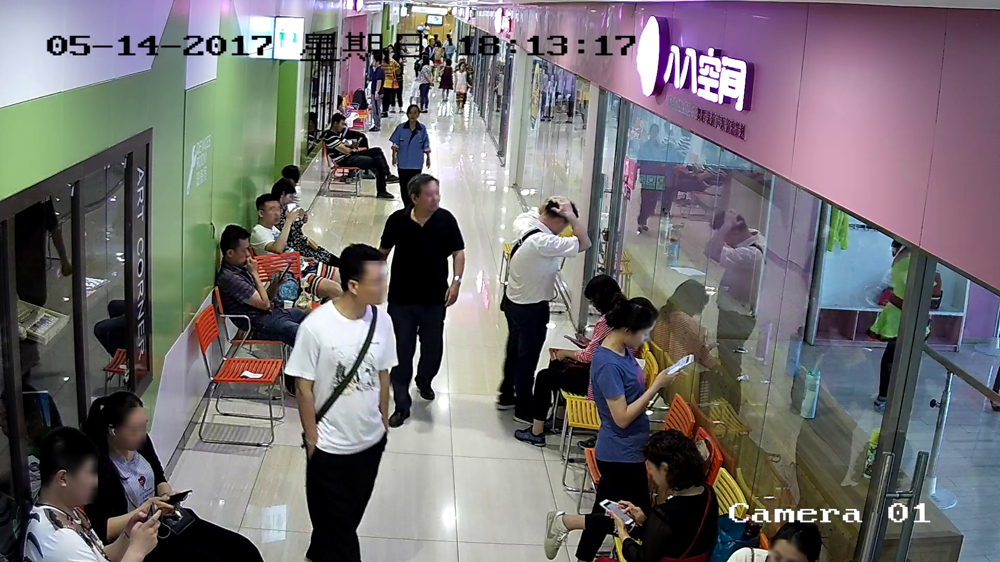

['0', '0.341667', '0.668519', '0.117708', '0.281481']
[7386, 21370, 21772, 6293, 4419, 508, 2063, 4623, 131, 139]
[2, '0.341667', '0.668519', '0.117708', '0.281481']


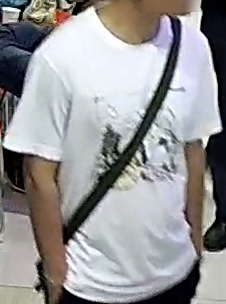

['0', '0.421354', '0.444444', '0.086458', '0.155556']
[19121, 2478, 1557, 2624, 1790, 2, 0, 13, 25, 278]
[0, '0.421354', '0.444444', '0.086458', '0.155556']


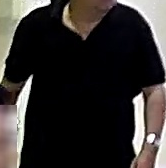

['0', '0.541667', '0.450926', '0.077083', '0.175926']
[1150, 4422, 16637, 1820, 2659, 35, 194, 597, 128, 478]
[2, '0.541667', '0.450926', '0.077083', '0.175926']


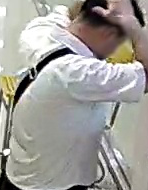

['0', '0.619792', '0.715278', '0.061458', '0.215741']
[2352, 148, 987, 3800, 3398, 22, 26, 15428, 740, 593]
[7, '0.619792', '0.715278', '0.061458', '0.215741']


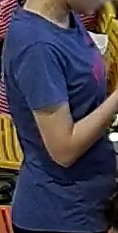

['0', '0.670312', '0.930093', '0.097917', '0.139815']
[22010, 104, 584, 2367, 1809, 1, 395, 16, 6, 1096]
[0, '0.670312', '0.930093', '0.097917', '0.139815']


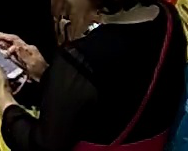

['0', '0.066927', '0.944444', '0.088021', '0.109259']
[4517, 3930, 3272, 2420, 187, 0, 430, 4897, 67, 222]
[7, '0.066927', '0.944444', '0.088021', '0.109259']


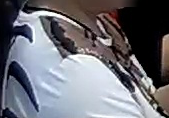

['0', '0.410156', '0.257870', '0.041146', '0.086111']
[546, 755, 862, 203, 194, 2, 76, 4567, 51, 91]
[7, '0.410156', '0.257870', '0.041146', '0.086111']


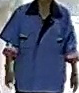

['0', '0.244271', '0.528241', '0.054167', '0.123148']
[5580, 82, 2104, 3291, 544, 2, 17, 1945, 165, 102]
[0, '0.244271', '0.528241', '0.054167', '0.123148']


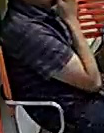

['0', '0.378125', '0.143519', '0.015625', '0.048148']
[547, 32, 85, 129, 72, 0, 1, 517, 99, 78]
[0, '0.378125', '0.143519', '0.015625', '0.048148']


In [42]:
from os import listdir, getcwd
from os.path import join,isfile
extensions = ['.txt']
mypath_ex = '/content/gdrive/.shortcut-targets-by-id/1hQoqbcLdIKP1y1vE2waDf28rLEbA3yqR/CEProject63-21ObjectDetection/dataset/ourdataset/ai'
path = getcwd()
files = [f for f in listdir(mypath_ex) if any(f.endswith(ext) for ext in extensions) ]
for e in files: 
  if isfile(e.replace('.txt','.jpg')):
    f = e.replace('.txt','.jpg')
  if isfile(e.replace('.txt','.jpeg')):
    f = e.replace('.txt','.jpeg')
  if isfile(e.replace('.txt','.png')):
    f = e.replace('.txt','.png')
  print(f,e)
  resss = findColorImg(f,e) 
  list_file = open(e, 'w')
  list_file.write(resss)
  list_file.close()

In [7]:
%cd /content/gdrive/.shortcut-targets-by-id/1hQoqbcLdIKP1y1vE2waDf28rLEbA3yqR/CEProject63-21ObjectDetection/dataset/ourdataset/

/content/gdrive/.shortcut-targets-by-id/1hQoqbcLdIKP1y1vE2waDf28rLEbA3yqR/CEProject63-21ObjectDetection/dataset/ourdataset


In [8]:
!pwd

/content/gdrive/.shortcut-targets-by-id/1hQoqbcLdIKP1y1vE2waDf28rLEbA3yqR/CEProject63-21ObjectDetection/dataset/ourdataset


9


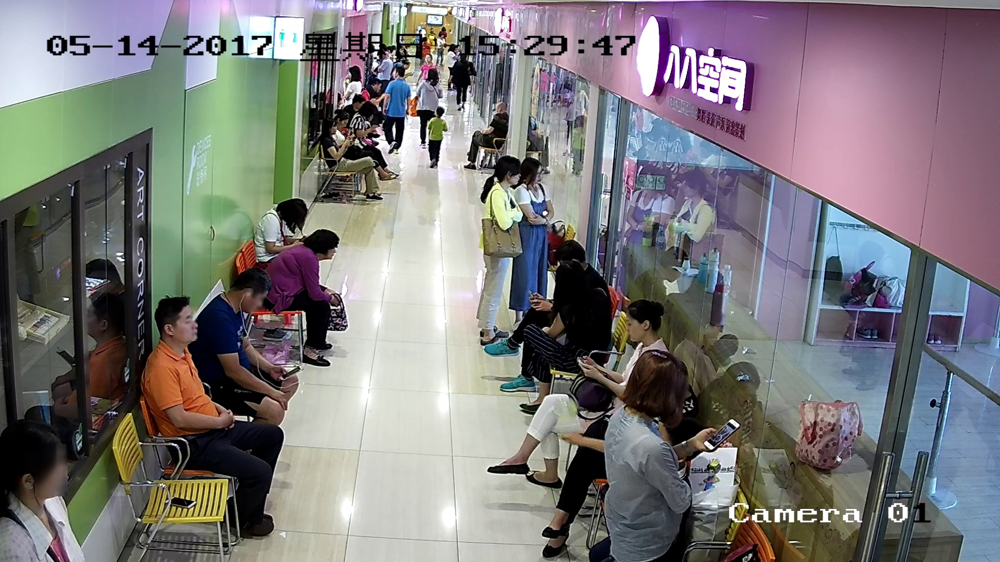

['6', '0.181250', '0.696759', '0.085417', '0.191667']
[10232, 46, 1162, 21219, 911, 129, 1, 153, 11, 84]
[3, '0.181250', '0.696759', '0.085417', '0.191667']


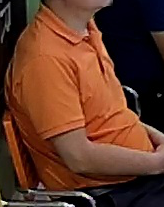

['1', '0.217448', '0.614815', '0.066146', '0.185185']
[11309, 163, 1627, 6594, 316, 860, 83, 3531, 109, 808]
[0, '0.217448', '0.614815', '0.066146', '0.185185']


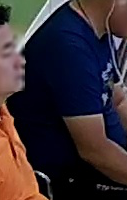

['8', '0.294010', '0.498611', '0.074479', '0.132407']
[5552, 549, 1480, 2016, 437, 186, 40, 227, 9065, 897]
[8, '0.294010', '0.498611', '0.074479', '0.132407']


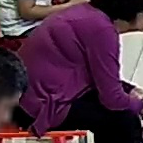

['2', '0.269531', '0.417130', '0.032813', '0.102778']
[678, 531, 2057, 699, 1064, 673, 395, 251, 515, 130]
[2, '0.269531', '0.417130', '0.032813', '0.102778']


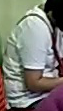

['4', '0.501823', '0.385185', '0.043229', '0.118519']
[743, 2591, 1309, 11, 5192, 318, 245, 215, 0, 0]
[4, '0.501823', '0.385185', '0.043229', '0.118519']


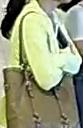

['1', '0.647917', '0.859722', '0.088542', '0.280556']
[9500, 47, 30139, 1791, 1029, 16, 5050, 3781, 19, 138]
[2, '0.647917', '0.859722', '0.088542', '0.280556']


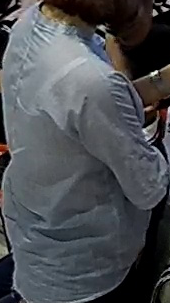

['1', '0.398177', '0.174537', '0.027604', '0.073148']
[157, 265, 178, 272, 93, 2, 817, 2276, 44, 83]
[7, '0.398177', '0.174537', '0.027604', '0.073148']


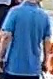

['7', '0.437240', '0.230556', '0.020313', '0.046296']
[183, 376, 82, 0, 1305, 1, 0, 3, 0, 0]
[4, '0.437240', '0.230556', '0.020313', '0.046296']


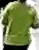

In [ ]:
findColorImg("/dataset/cp/024bb10a9cf0ab4992d6a20d13890833.jpg","/dataset/cp_annotation/024bb10a9cf0ab4992d6a20d13890833.txt")